Bùi Hoàng Phúc </br>
18055891

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Giải nén tập dữ liệu


In [ ]:
%cd /content/
!tar -xvf  "/content/drive/MyDrive/TOMAUANH/data_crawl/imagecrawl_all_final.tar" 

Streaming output truncated to the last 5000 lines.
content/imagecrawl_gia_tre1/istockphoto3016.jpg
content/imagecrawl_gia_tre1/istockphotos3761.jpg
content/imagecrawl_gia_tre1/istockphoto504.jpg
content/imagecrawl_gia_tre1/istockphotos2513.jpg
content/imagecrawl_gia_tre1/istockphoto1843.jpg
content/imagecrawl_gia_tre1/istockphotos1258.jpg
content/imagecrawl_gia_tre1/istockphoto5127.jpg
content/imagecrawl_gia_tre1/istockphoto4762.jpg
content/imagecrawl_gia_tre1/istockphoto3275.jpg
content/imagecrawl_gia_tre1/istockphotos295.jpg
content/imagecrawl_gia_tre1/istockphotos5408.jpg
content/imagecrawl_gia_tre1/istockphoto113.jpg
content/imagecrawl_gia_tre1/istockphotos5309.jpg
content/imagecrawl_gia_tre1/istockphotos2908.jpg
content/imagecrawl_gia_tre1/istockphotos635.jpg
content/imagecrawl_gia_tre1/istockphotos3427.jpg
content/imagecrawl_gia_tre1/istockphotos2615.jpg
content/imagecrawl_gia_tre1/istockphoto782.jpg
content/imagecrawl_gia_tre1/istockphotos5055.jpg
content/imagecrawl_gia_tre1/ist

# import Thư viện

In [ ]:
from PIL import Image
from sklearn.model_selection import train_test_split
import numpy as np
import pickle
from matplotlib import image
from matplotlib import pyplot as plt
import os
import time
import tensorflow as tf
from tensorflow import keras
from tqdm import tqdm
from tensorflow.keras import applications
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras import applications
from keras.utils.vis_utils import plot_model
from tensorflow.keras import layers
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input, decode_predictions
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import random
import cv2
tf.config.run_functions_eagerly(True)

# Size of the image required to train our model
img_size = 256
%cd /content/content/imagecrawl_gia_tre1
master_dir = '/content/content/imagecrawl_gia_tre1'

/content/content/imagecrawl_gia_tre1


# Preprocessing

In [ ]:
dataset_split = 10000
def get_dataset(num):
    x = []
    y = []

    for image_file in tqdm(os.listdir( master_dir )[ num*dataset_split : (num+1)*dataset_split ]):
        try:
          rgb_image = Image.open( image_file ).resize( ( img_size , img_size ) )
          # rgb_img_array = (np.asarray( rgb_image ) ) / 255
          rgb_image = np.array(rgb_image)
          img_lab = rgb2lab(rgb_image).astype("float32")
          L = img_lab[...,[0] ]/ 50. - 1.
          ab = img_lab[...,[1, 2] ]/ 110. 
          x.append( L )
          y.append( ab )
          del rgb_image
        except:
          pass

    train_x, test_x, train_y, test_y=  train_test_split(np.array(x) , np.array(y),test_size=0.001)
    BUFFER_SIZE = len(x)
    BATCH_SIZE = 32
    steps_per_epoch = len(x)//BATCH_SIZE
    dataset = tf.data.Dataset.from_tensor_slices( (train_x,train_y) )
    dataset = dataset.cache()
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    del x, y,train_x, test_x, train_y, test_y
    return dataset

# cGAN

### Mô hình Generator

In [ ]:
def get_generator_model():
    
    inputs = tf.keras.layers.Input( shape=( img_size , img_size , 1 ) )

    conv1 = tf.keras.layers.Conv2D( 64, kernel_size=(4, 4), strides=(2, 2), padding='same')( inputs )

    conv1 = tf.keras.layers.LeakyReLU(0.2)( conv1 )
    conv1 = tf.keras.layers.Conv2D( 128 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same')( conv1 )
    conv1 = tf.keras.layers.BatchNormalization()( conv1 )

    conv2 = tf.keras.layers.LeakyReLU(0.2)( conv1 )
    conv2 = tf.keras.layers.Conv2D( 256 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same')( conv2 )
    conv2 = tf.keras.layers.BatchNormalization()( conv2 )

    conv3 = tf.keras.layers.LeakyReLU(0.2)( conv2 )
    conv3 = tf.keras.layers.Conv2D( 512 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same')( conv3 )
    conv3 = tf.keras.layers.BatchNormalization()( conv3 )

    conv3 = tf.keras.layers.LeakyReLU(0.2)( conv3 )
    conv3 = tf.keras.layers.Conv2D( 512 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same')( conv3 )
    conv3 = tf.keras.layers.BatchNormalization()( conv3 )

    conv3 = tf.keras.layers.LeakyReLU(0.2)( conv3 )
    conv3 = tf.keras.layers.Conv2D( 512 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same')( conv3 )
    conv3 = tf.keras.layers.BatchNormalization()( conv3 )

    conv4 = tf.keras.layers.LeakyReLU(0.2)( conv3 )
    conv4 = tf.keras.layers.Conv2D( 512 , kernel_size=( 4 , 4 ), strides=(2, 2), padding='same')( conv4 )
    conv4 = tf.keras.layers.ReLU()( conv4 )
    conv4 = tf.keras.layers.Conv2DTranspose( 512 , kernel_size=( 4 , 4 ), strides=(2, 2), padding='same' )( conv4 )
    conv4 = tf.keras.layers.BatchNormalization()( conv4 )

    conv5 = tf.keras.layers.ReLU()( conv4 )
    conv5 = tf.keras.layers.Conv2DTranspose( 512 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same' )( conv5 )
    conv5 = tf.keras.layers.BatchNormalization()( conv5 )

    conv5 = tf.keras.layers.ReLU()( conv5 )
    conv5 = tf.keras.layers.Conv2DTranspose( 512 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same' )( conv5 )
    conv5 = tf.keras.layers.BatchNormalization()( conv5 )



    conv5 = tf.keras.layers.ReLU()( conv5 )
    conv5 = tf.keras.layers.Conv2DTranspose( 256 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same' )( conv5 )
    conv5 = tf.keras.layers.BatchNormalization()( conv5 )


    conv6 = tf.keras.layers.ReLU()( conv5 )
    conv6 = tf.keras.layers.Conv2DTranspose( 128 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same' )( conv6 )
    conv6 = tf.keras.layers.BatchNormalization()( conv6 )

    conv7 = tf.keras.layers.ReLU()( conv6 )
    conv7 = tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 4 , 4 ) , strides=(2, 2), padding='same' )( conv7 )
    conv7 = tf.keras.layers.BatchNormalization()( conv7 )

    conv8 = tf.keras.layers.ReLU()( conv7 )
    conv8 = tf.keras.layers.Conv2DTranspose( 2 , kernel_size=( 4 , 4 ) ,activation='tanh', strides=(2, 2), padding='same' )( conv8 )
    model = tf.keras.models.Model( inputs , conv8 )
    return model

In [ ]:
get_generator_model().summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1088      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       131200    
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                             

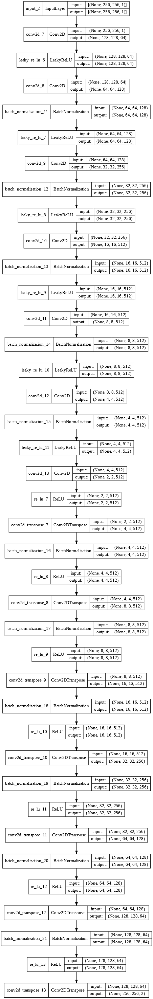

In [ ]:
plot_model(get_generator_model(), to_file='generator.png', show_shapes=True, show_layer_names=True, dpi=66)

### Mô hình Discriminator

In [ ]:
def get_discriminator_model():
    layers = [
        tf.keras.layers.Conv2D( 32 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu' ,input_shape=( img_size , img_size , 2 ) ),
        tf.keras.layers.LeakyReLU(0.2),

        # tf.keras.layers.Conv2D( 32 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu'),
        # tf.keras.layers.BatchNormalization(),
        # tf.keras.layers.LeakyReLU(0.2),

        tf.keras.layers.Conv2D( 64 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(0.2),

        tf.keras.layers.Conv2D( 128 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(0.2),

        tf.keras.layers.Conv2D( 256 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(0.2),

        tf.keras.layers.Conv2D( 512 , kernel_size=( 4, 4 ) , strides= (2, 2) , activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(0.2),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense( 512, activation='relu'  )  ,
        tf.keras.layers.Dense( 128 , activation='relu' ) ,
        tf.keras.layers.Dense( 16 , activation='relu' ) ,
        tf.keras.layers.Dense( 1 , activation='sigmoid' ) 
    ]
    model = tf.keras.models.Sequential( layers )
    return model

In [ ]:
get_discriminator_model().summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 127, 127, 32)      1056      
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 127, 127, 32)      0         
                                                                 
 conv2d_15 (Conv2D)          (None, 62, 62, 64)        32832     
                                                                 
 batch_normalization_22 (Bat  (None, 62, 62, 64)       256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 62, 62, 64)        0         
                                                                 
 conv2d_16 (Conv2D)          (None, 30, 30, 128)       131200    
                                                        

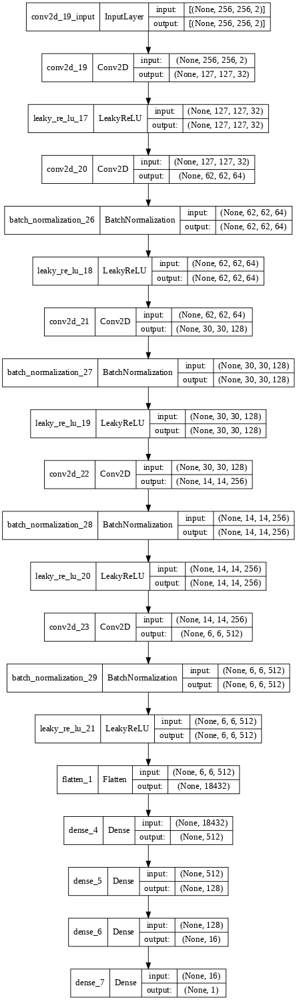

In [ ]:
plot_model(get_discriminator_model(), to_file='discriminator.png', show_shapes=True, show_layer_names=True, dpi=66)

## Định nghĩa hàm loss cho 2 model cGAN

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) - tf.random.uniform( shape=real_output.shape , maxval=0.1 ) , real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output) + tf.random.uniform( shape=fake_output.shape , maxval=0.1  ) , fake_output)
    total_loss = (real_loss + fake_loss)*0.5
    return total_loss

def generator_loss(fake_output , real_y):
    real_y = tf.cast( real_y , 'float32' )
    return mse( real_y , fake_output ) + 100. * mae(real_y ,fake_output )

generator_optimizer = tf.keras.optimizers.Adam( 0.0005 )
discriminator_optimizer = tf.keras.optimizers.Adam( 0.0005 )

generator = get_generator_model()
discriminator = get_discriminator_model()


In [ ]:
@tf.function
def train_step( input_x , real_y ):
   
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate an image -> G( x )
        generated_images = generator( input_x , training=True)
        # Probability that the given image is real -> D( x )
        real_output = discriminator( real_y, training=True)
        # Probability that the given image is the one generated -> D( G( x ) )
        generated_output = discriminator(generated_images, training=True)
        
        # L2 Loss -> || y - G(x) ||^2 + L1 loss*lamda
        gen_loss = generator_loss( generated_images , real_y )
        # Log loss for the discriminator
        disc_loss = discriminator_loss( real_output, generated_output )
        
        
        losses["D"].append(disc_loss.numpy())
        losses["G"].append(gen_loss.numpy())
    # tf.keras.backend.print_tensor( tf.keras.backend.mean( gen_loss ) )
    # tf.keras.backend.print_tensor( gen_loss + disc_loss )
    # Compute the gradients
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Optimize with Adam
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

generator.compile(
    optimizer=generator_optimizer,
    loss=generator_loss,
    metrics=['accuracy']
)

discriminator.compile(
    optimizer=discriminator_optimizer,
    loss=discriminator_loss,
    metrics=['accuracy']
)


## Định nghĩa hàm show ảnh

In [ ]:
def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    L = (L + 1.) * 50.
    ab = ab * 110.
    # print(L.shape,ab.shape)
    Lab = tf.concat([L, ab], axis=-1)
    # print(Lab.shape)
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
def visualize(model,data, save=True):
    for a,b in data:
      mm = model.predict(a)
    fake_imgs = lab_to_rgb(a, mm)
    real_imgs = lab_to_rgb(a, b)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(2, 5, i + 1 )
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(2, 5, i + 1 + 5)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

## Train model

In [ ]:
generator.load_weights('/content/drive/MyDrive/TOMAUANH/model/modeGEN256_4.h5')

In [ ]:
num_epochs = 10
losses = {"D":[], "G":[]}
for i in range(0,12):
    dataset=get_dataset(i)
    for e in range( num_epochs ):
        print("Running epoch : ", e )
        for (batch,( x , y )) in enumerate(dataset):
            train_step( x , y )
            if batch % 200==0:
                print('loss D: ',np.mean(losses['D']), '  loss G: ',np.mean(losses['G']))
                visualize(generator ,dataset.take(1))

                # ảnh hàng đầu tiên sẽ là ảnh predict
                # ảnh hàng thứ 2 sẽ là ảnh label


    del dataset

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
generator.save('/content/drive/MyDrive/TOMAUANH/model/modeGEN256_4.h5')


## Biểu đồ hàm loss_D và loss_G

In [ ]:
def plot_loss(losses):

    g_loss = []
    d_loss = []
    index =  0
    for i in range(0,len(losses['D']),200):
        d_loss.append(np.mean(losses['D'][index:i]))
        index=i

    for i in range(0,len(losses['G']),200):
        g_loss.append(np.mean(losses['G'][index:i]))
        index=i

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


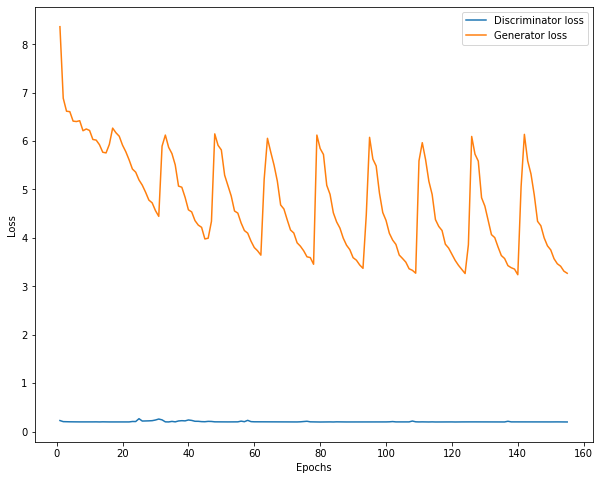

In [ ]:
plot_loss(losses)

  - loss D hầu như không thay đổi nhiều
  - loss G có xu hướng giảm dần, một vài đoạn tăng đột ngột là do sự chuyển đổi đến tập dataset khác

# Resnet Fine-turning

## Preprocessing

In [ ]:
dataset_split = 30000
def get_dataset_hsv(num):
    x = []
    y = []

    for image_file in tqdm(os.listdir( master_dir )[ num*dataset_split : (num+1)*dataset_split ]):
        try:
          img = cv2.imread(os.path.join( master_dir , image_file ))
          img = cv2.resize(img, (img_size, img_size))
          img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
          x.append( img_hsv[:, :, 2] )
          y.append( img_hsv[:, :, :2] )
          del img,img_hsv
        except:
          pass


    train_x, test_x, train_y, test_y = train_test_split( np.array(x) , np.array(y) , test_size=0.0001 )
    BUFFER_SIZE = len(x)
    BATCH_SIZE = 32
    steps_per_epoch = len(x)//BATCH_SIZE
    dataset = tf.data.Dataset.from_tensor_slices( (train_x,train_y) )
    dataset = dataset.cache()
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    del train_x, test_x, train_y, test_y, x, y
    return dataset

## Mô hình 

In [ ]:
resnet = applications.resnet50.ResNet50(weights=None, classes=365, input_shape=(256,256,1))
x = resnet.output
model_tmp = Model(inputs = resnet.input, outputs = x)
layer_3, layer_7, layer_13, layer_16 = model_tmp.get_layer('conv2_block1_1_relu').output,\
                                      model_tmp.get_layer('conv3_block1_1_relu').output, \
                                      model_tmp.get_layer('conv4_block1_1_relu').output, \
                                      model_tmp.get_layer('conv5_block1_2_conv').output

fcn1 = Conv2D(filters=2 , kernel_size=1, name='fcn1')(layer_16)

fcn2 = Conv2DTranspose(filters=layer_13.get_shape().as_list()[-1] , kernel_size=4, strides=2, padding='same', name='fcn2')(fcn1)
fcn2_skip_connected = Add(name="fcn2_plus_layer13")([fcn2, layer_13])

fcn3 = Conv2DTranspose(filters=layer_7.get_shape().as_list()[-1], kernel_size=4, strides=2, padding='same', name="fcn3")(fcn2_skip_connected)
fcn3_skip_connected = Add(name="fcn3_plus_layer_7")([fcn3, layer_7])

fcn4 = Conv2DTranspose(filters=layer_3.get_shape().as_list()[-1], kernel_size=4, strides=2, padding='same', name="fcn4")(fcn3_skip_connected)
fcn4_skip_connected = Add(name="fcn4_plus_layer_3")([fcn4, layer_3])

# Upsample again
fcn5 = Conv2DTranspose(filters=2, kernel_size=16, strides=(4, 4), padding='same', name="fcn5")(fcn4_skip_connected)
relu255 = ReLU(max_value=255) (fcn5)

model = Model(inputs = resnet.input, outputs = relu255)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 1)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  3200        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

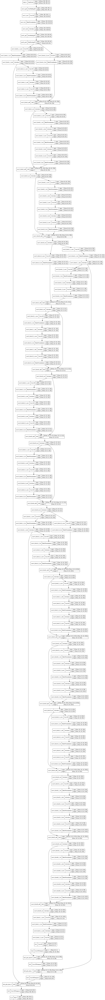

In [ ]:
plot_model(model, to_file='modelresnetFT.png', show_shapes=True, show_layer_names=True, dpi=66)

In [ ]:
def hsv_to_rgb(v, hs):
    hsv_imgs = []
    for img,img_pre in zip(v, hs):
        img_ze = np.zeros((img_size, img_size, 3))
        img_ze[:, :, 2] = img  # V
        img_ze[:, :, 0] = img_pre[:, :, 0]  # H
        img_ze[:, :, 1] = img_pre[:, :, 1]  # S
        img_ze = np.array(img_ze, np.uint8)
        img_final = cv2.cvtColor(img_ze, cv2.COLOR_HSV2RGB)
        hsv_imgs.append(img_final)
    return np.stack(hsv_imgs, axis=0)

class PredictEEpoch(tf.keras.callbacks.Callback):
      def __init__(self, num_take, model):
        self.num_take = num_take
        self.model = model
      
      def on_epoch_end(self, epoch,logs=None):
          data = dataset.take(self.num_take)
          for a,b in data:
              mm = self.model.predict(a)
          
          fake_imgs = hsv_to_rgb(a, mm)
          real_imgs = hsv_to_rgb(a, b)
          fig = plt.figure(figsize=(15, 8))
          for i in range(5):
              ax = plt.subplot(2, 5, i + 1 )
              ax.imshow(fake_imgs[i])
              ax.axis("off")
              ax = plt.subplot(2, 5, i + 1 + 5)
              ax.imshow(real_imgs[i])
              ax.axis("off")
          plt.show()

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse',metrics=['accuracy'])
from keras.callbacks import ModelCheckpoint

filepath = '/content/drive/MyDrive/TOMAUANH/model/modelResnets.h5'
# Set a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5,
                                            min_lr=0.00001)

checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, save_weights_only=True, mode='min')
PredictEEpoch = PredictEEpoch(num_take=20, model=model)
callbacks_list = [checkpoint,PredictEEpoch,learning_rate_reduction]

## Train model

In [ ]:
# batch_size = 32
dataset = get_dataset_hsv(0)


100%|██████████| 60000/60000 [02:02<00:00, 487.93it/s]


In [ ]:
his = model.fit(dataset,
                epochs=20,
                verbose=1,
                validation_data=dataset.take(10),
                callbacks=callbacks_list)


In [ ]:
his2 = model.fit(get_dataset_hsv(1),
                epochs=20,
                verbose=1,
                validation_data=dataset.take(10),
                callbacks=callbacks_list)

100%|██████████| 30000/30000 [00:51<00:00, 576.94it/s]


Epoch 1/20
937/937 [==============================] - ETA: 0s - loss: 3052.4631 - accuracy: 0.7318
Epoch 00001: loss improved from inf to 3052.46313, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:4527: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


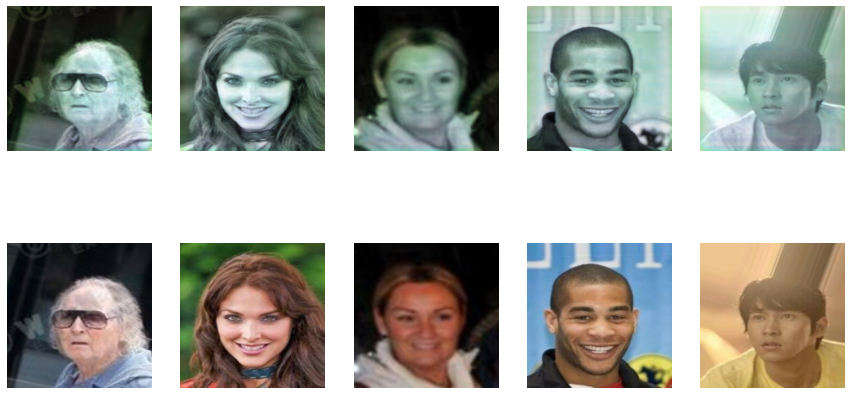

937/937 [==============================] - 255s 264ms/step - loss: 3052.4631 - accuracy: 0.7318 - val_loss: 5084.2061 - val_accuracy: 0.4013 - lr: 0.0010
Epoch 2/20
937/937 [==============================] - ETA: 0s - loss: 2780.5178 - accuracy: 0.7532
Epoch 00002: loss improved from 3052.46313 to 2780.51782, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


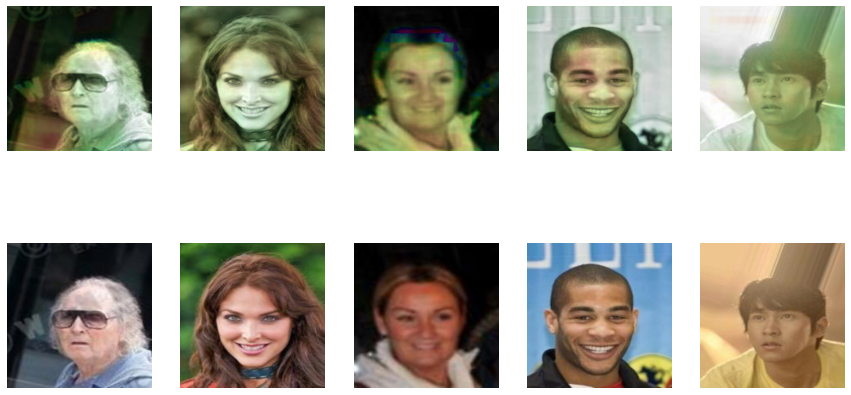

937/937 [==============================] - 246s 263ms/step - loss: 2780.5178 - accuracy: 0.7532 - val_loss: 3806.2004 - val_accuracy: 0.6810 - lr: 0.0010
Epoch 3/20
937/937 [==============================] - ETA: 0s - loss: 2682.2861 - accuracy: 0.7591
Epoch 00003: loss improved from 2780.51782 to 2682.28613, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


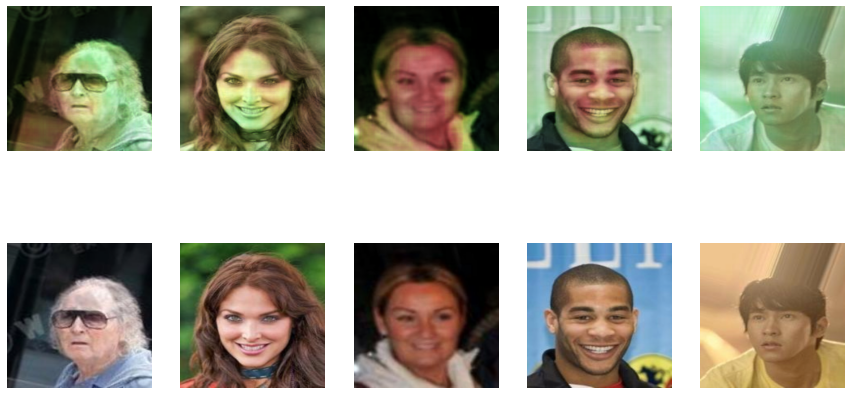

937/937 [==============================] - 246s 263ms/step - loss: 2682.2861 - accuracy: 0.7591 - val_loss: 3009.8862 - val_accuracy: 0.7493 - lr: 0.0010
Epoch 4/20
937/937 [==============================] - ETA: 0s - loss: 2601.9111 - accuracy: 0.7642
Epoch 00004: loss improved from 2682.28613 to 2601.91113, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


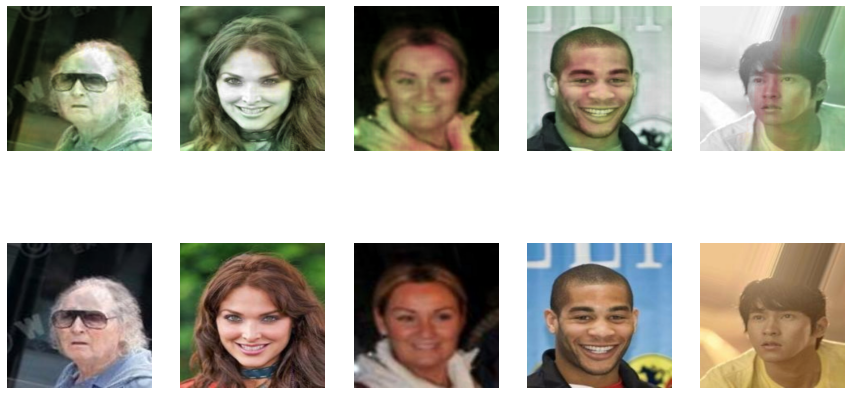

937/937 [==============================] - 246s 262ms/step - loss: 2601.9111 - accuracy: 0.7642 - val_loss: 3992.4714 - val_accuracy: 0.6341 - lr: 0.0010
Epoch 5/20
937/937 [==============================] - ETA: 0s - loss: 2536.4600 - accuracy: 0.7681
Epoch 00005: loss improved from 2601.91113 to 2536.45996, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


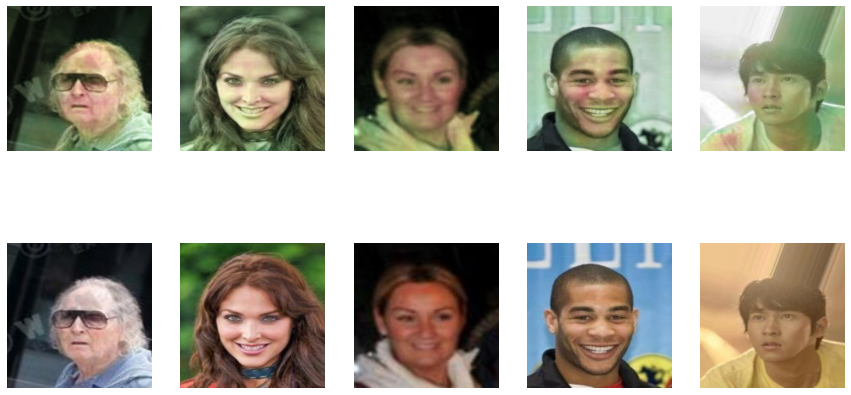

937/937 [==============================] - 246s 262ms/step - loss: 2536.4600 - accuracy: 0.7681 - val_loss: 3414.2710 - val_accuracy: 0.7108 - lr: 0.0010
Epoch 6/20
937/937 [==============================] - ETA: 0s - loss: 2461.8828 - accuracy: 0.7721
Epoch 00006: loss improved from 2536.45996 to 2461.88281, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


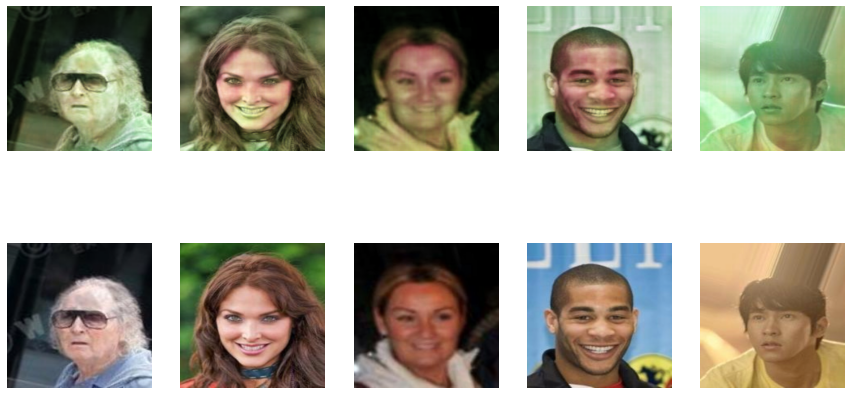

937/937 [==============================] - 246s 262ms/step - loss: 2461.8828 - accuracy: 0.7721 - val_loss: 2709.7188 - val_accuracy: 0.7647 - lr: 0.0010
Epoch 7/20
937/937 [==============================] - ETA: 0s - loss: 2392.5217 - accuracy: 0.7760
Epoch 00007: loss improved from 2461.88281 to 2392.52173, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


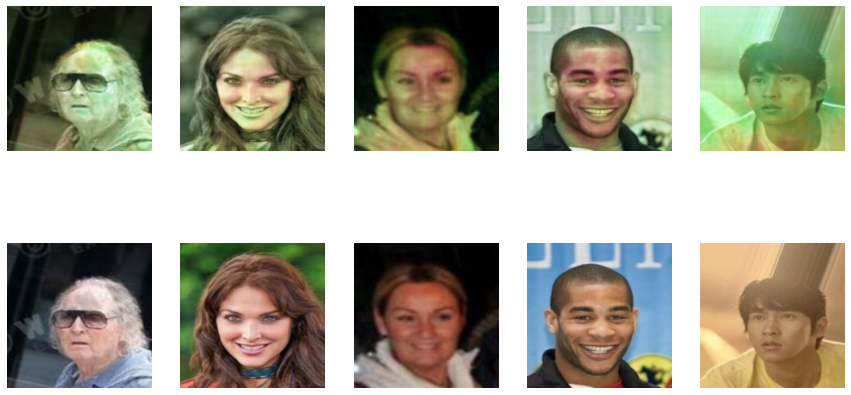

937/937 [==============================] - 246s 262ms/step - loss: 2392.5217 - accuracy: 0.7760 - val_loss: 2823.2759 - val_accuracy: 0.7568 - lr: 0.0010
Epoch 8/20
937/937 [==============================] - ETA: 0s - loss: 2328.6045 - accuracy: 0.7800
Epoch 00008: loss improved from 2392.52173 to 2328.60449, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


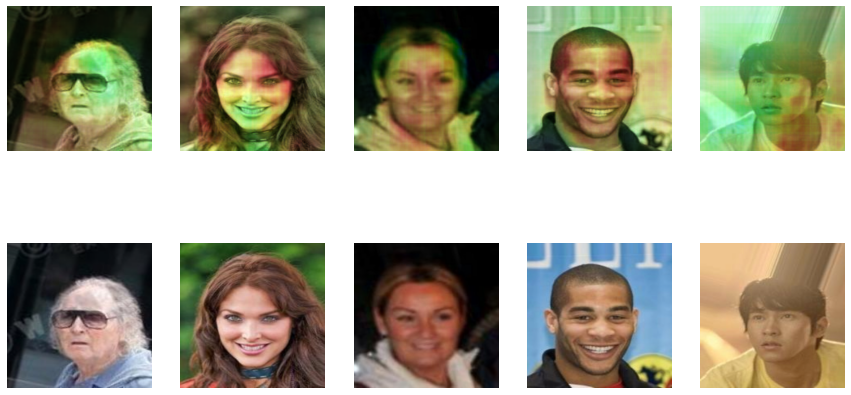

937/937 [==============================] - 246s 262ms/step - loss: 2328.6045 - accuracy: 0.7800 - val_loss: 3169.6187 - val_accuracy: 0.7497 - lr: 0.0010
Epoch 9/20
937/937 [==============================] - ETA: 0s - loss: 2243.3413 - accuracy: 0.7853
Epoch 00009: loss improved from 2328.60449 to 2243.34131, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


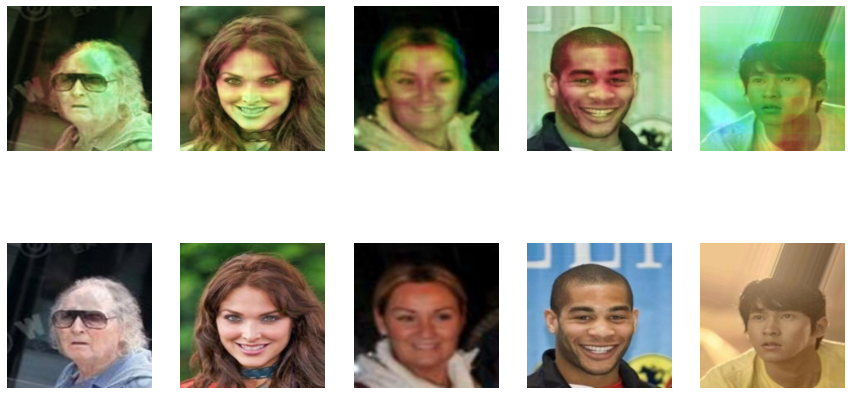


Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
937/937 [==============================] - 246s 262ms/step - loss: 2243.3413 - accuracy: 0.7853 - val_loss: 3173.0642 - val_accuracy: 0.7455 - lr: 0.0010
Epoch 10/20
937/937 [==============================] - ETA: 0s - loss: 2091.9197 - accuracy: 0.7959
Epoch 00010: loss improved from 2243.34131 to 2091.91968, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


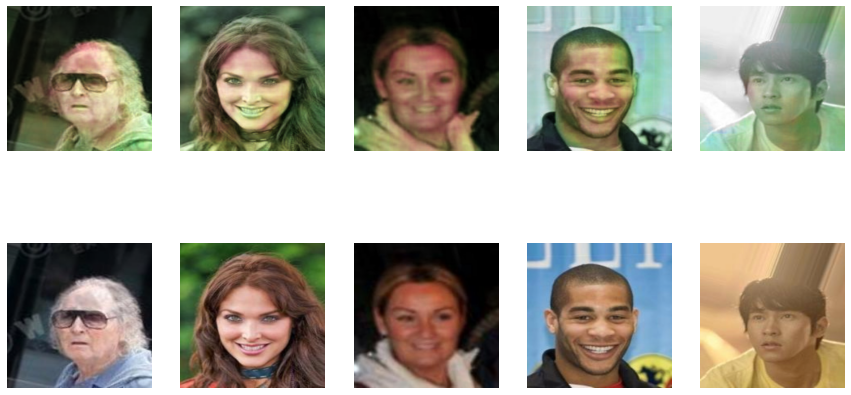

937/937 [==============================] - 246s 263ms/step - loss: 2091.9197 - accuracy: 0.7959 - val_loss: 2955.0134 - val_accuracy: 0.7436 - lr: 5.0000e-04
Epoch 11/20
937/937 [==============================] - ETA: 0s - loss: 1954.4583 - accuracy: 0.8074
Epoch 00011: loss improved from 2091.91968 to 1954.45825, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


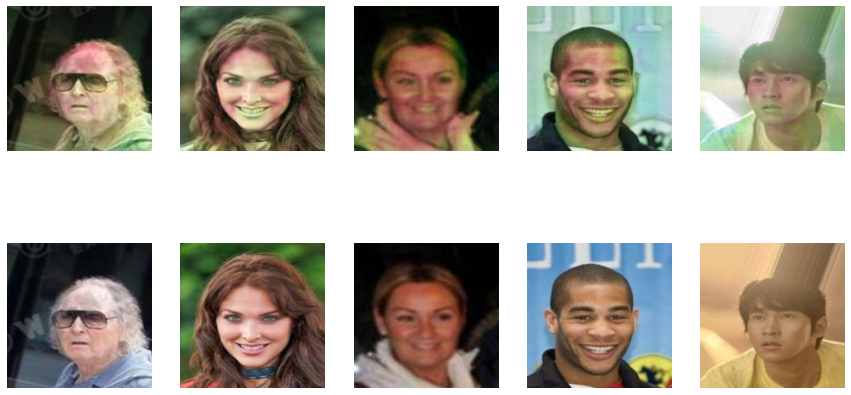

937/937 [==============================] - 246s 262ms/step - loss: 1954.4583 - accuracy: 0.8074 - val_loss: 2713.7803 - val_accuracy: 0.7741 - lr: 5.0000e-04
Epoch 12/20
937/937 [==============================] - ETA: 0s - loss: 1840.3734 - accuracy: 0.8179
Epoch 00012: loss improved from 1954.45825 to 1840.37341, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


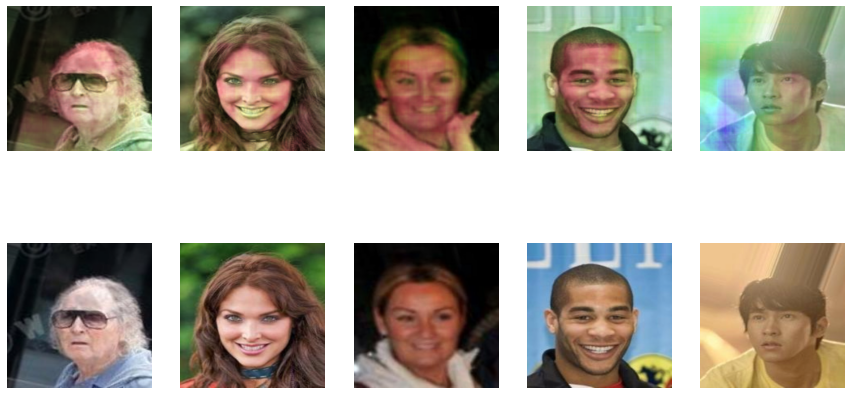

937/937 [==============================] - 246s 262ms/step - loss: 1840.3734 - accuracy: 0.8179 - val_loss: 2174.8157 - val_accuracy: 0.8054 - lr: 5.0000e-04
Epoch 13/20
937/937 [==============================] - ETA: 0s - loss: 1745.2152 - accuracy: 0.8266
Epoch 00013: loss improved from 1840.37341 to 1745.21521, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


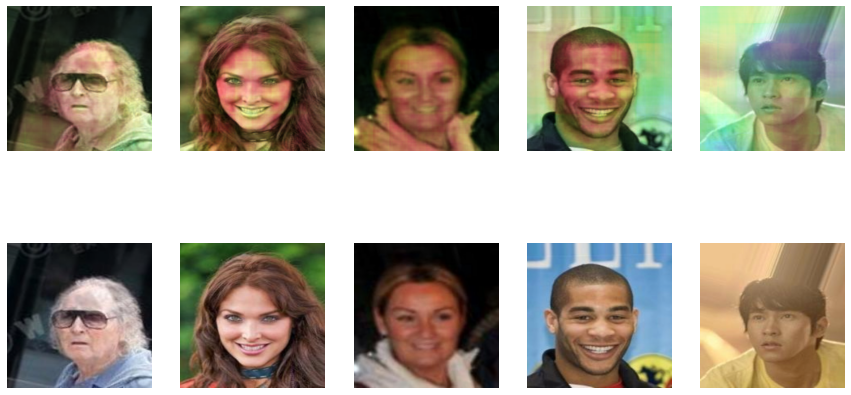

937/937 [==============================] - 245s 262ms/step - loss: 1745.2152 - accuracy: 0.8266 - val_loss: 2240.5188 - val_accuracy: 0.7916 - lr: 5.0000e-04
Epoch 14/20
937/937 [==============================] - ETA: 0s - loss: 1660.4349 - accuracy: 0.8335
Epoch 00014: loss improved from 1745.21521 to 1660.43494, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


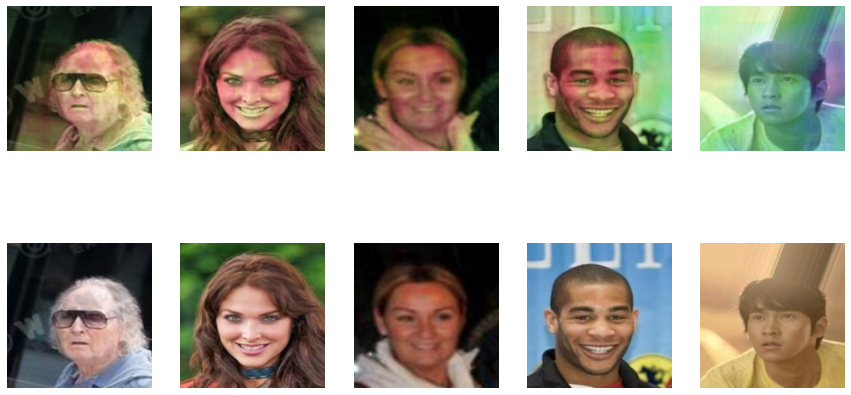

937/937 [==============================] - 245s 262ms/step - loss: 1660.4349 - accuracy: 0.8335 - val_loss: 2252.0918 - val_accuracy: 0.7976 - lr: 5.0000e-04
Epoch 15/20
937/937 [==============================] - ETA: 0s - loss: 1585.1174 - accuracy: 0.8398
Epoch 00015: loss improved from 1660.43494 to 1585.11743, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


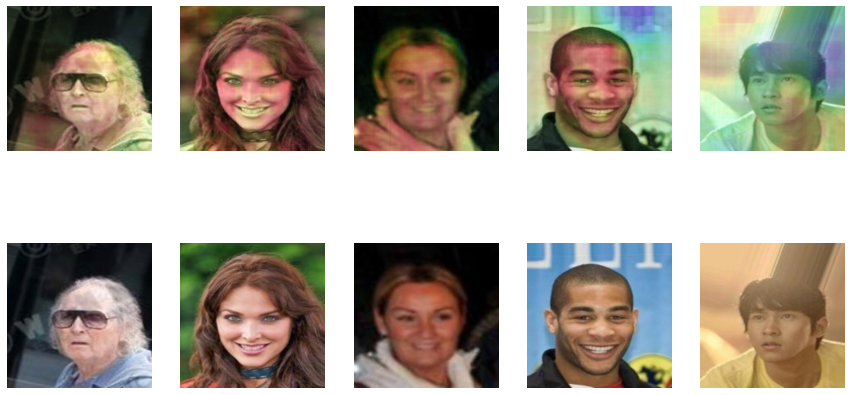


Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
937/937 [==============================] - 246s 262ms/step - loss: 1585.1174 - accuracy: 0.8398 - val_loss: 2497.4929 - val_accuracy: 0.7821 - lr: 5.0000e-04
Epoch 16/20
937/937 [==============================] - ETA: 0s - loss: 1520.8036 - accuracy: 0.8446
Epoch 00016: loss improved from 1585.11743 to 1520.80359, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


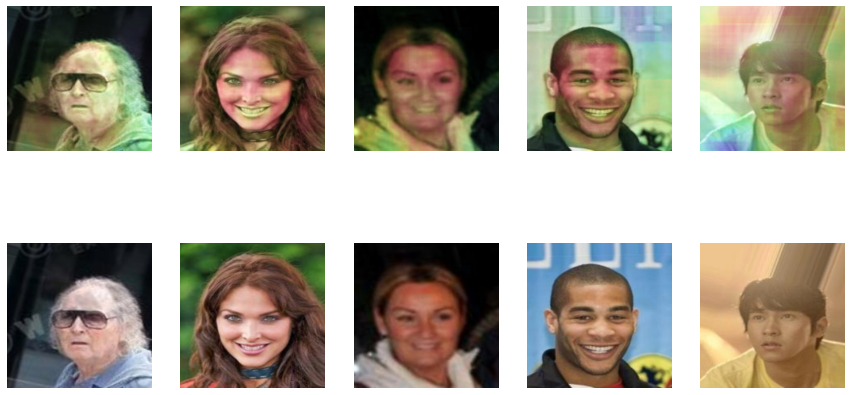

937/937 [==============================] - 246s 262ms/step - loss: 1520.8036 - accuracy: 0.8446 - val_loss: 1966.8479 - val_accuracy: 0.8177 - lr: 2.5000e-04
Epoch 17/20
937/937 [==============================] - ETA: 0s - loss: 1427.4127 - accuracy: 0.8527
Epoch 00017: loss improved from 1520.80359 to 1427.41272, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


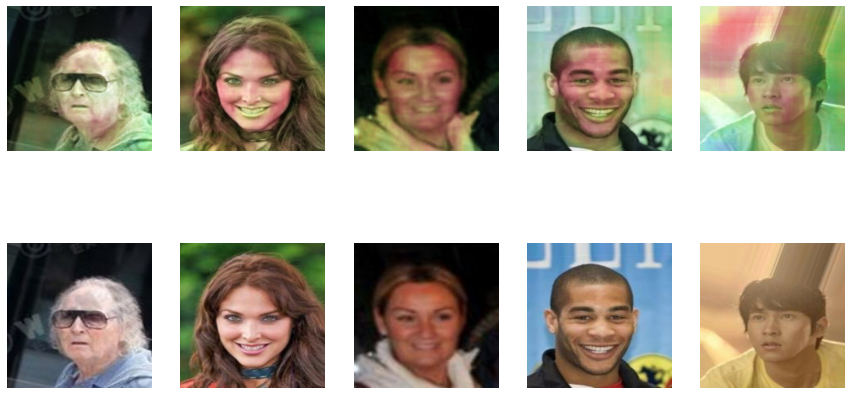

937/937 [==============================] - 246s 263ms/step - loss: 1427.4127 - accuracy: 0.8527 - val_loss: 1809.9379 - val_accuracy: 0.8324 - lr: 2.5000e-04
Epoch 18/20
937/937 [==============================] - ETA: 0s - loss: 1367.0144 - accuracy: 0.8578
Epoch 00018: loss improved from 1427.41272 to 1367.01440, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


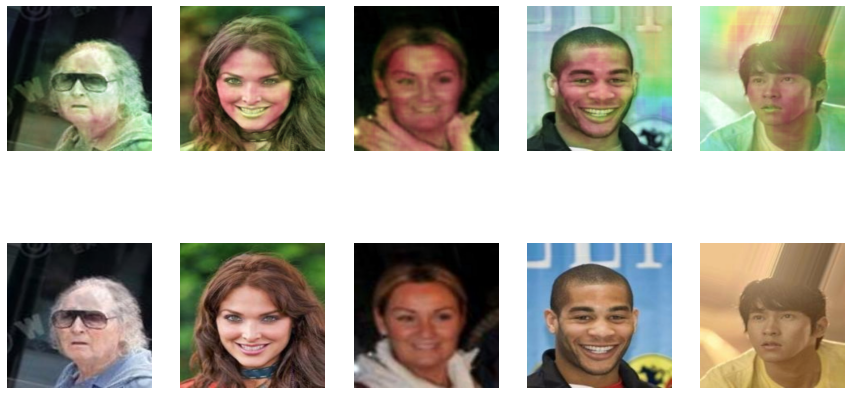

937/937 [==============================] - 246s 262ms/step - loss: 1367.0144 - accuracy: 0.8578 - val_loss: 1808.7734 - val_accuracy: 0.8333 - lr: 2.5000e-04
Epoch 19/20
937/937 [==============================] - ETA: 0s - loss: 1326.8789 - accuracy: 0.8610
Epoch 00019: loss improved from 1367.01440 to 1326.87891, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


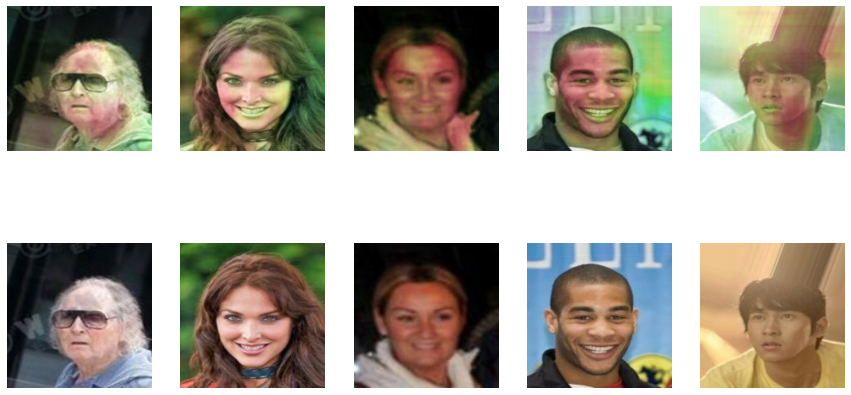

937/937 [==============================] - 246s 262ms/step - loss: 1326.8789 - accuracy: 0.8610 - val_loss: 2002.2727 - val_accuracy: 0.8231 - lr: 2.5000e-04
Epoch 20/20
937/937 [==============================] - ETA: 0s - loss: 1304.3250 - accuracy: 0.8627
Epoch 00020: loss improved from 1326.87891 to 1304.32495, saving model to /content/drive/MyDrive/TOMAUANH/model/modelResnets.h5


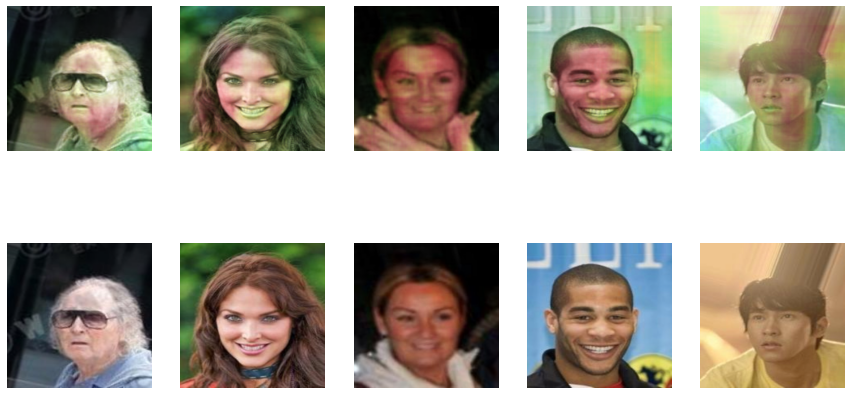

937/937 [==============================] - 246s 262ms/step - loss: 1304.3250 - accuracy: 0.8627 - val_loss: 2061.4934 - val_accuracy: 0.8207 - lr: 2.5000e-04


100%|██████████| 30000/30000 [01:03<00:00, 474.39it/s]


Epoch 1/20
937/937 [==============================] - ETA: 0s - loss: 2300.6650 - accuracy: 0.7799
Epoch 00001: loss did not improve from 1304.32495


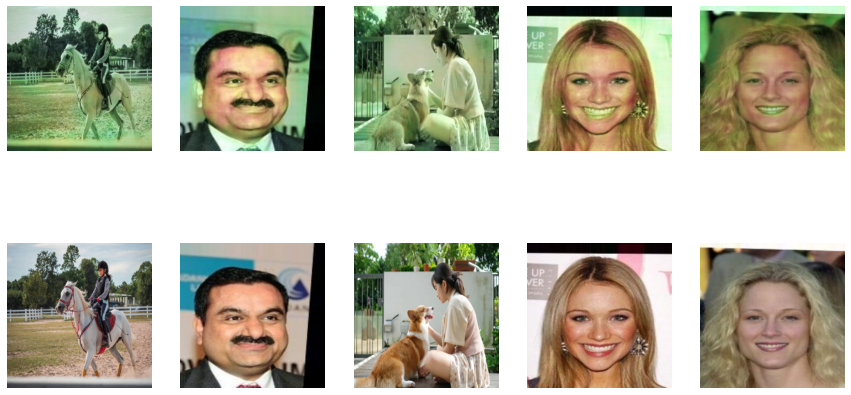

937/937 [==============================] - 246s 262ms/step - loss: 2300.6650 - accuracy: 0.7799 - val_loss: 2281.2212 - val_accuracy: 0.7728 - lr: 2.5000e-04
Epoch 2/20
937/937 [==============================] - ETA: 0s - loss: 2168.8655 - accuracy: 0.7877
Epoch 00002: loss did not improve from 1304.32495


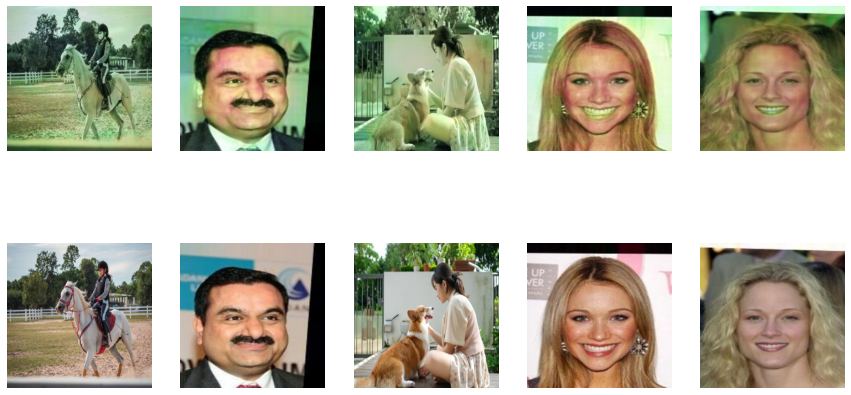

937/937 [==============================] - 246s 263ms/step - loss: 2168.8655 - accuracy: 0.7877 - val_loss: 2207.3054 - val_accuracy: 0.7768 - lr: 2.5000e-04
Epoch 3/20
743/937 [======================>.......] - ETA: 49s - loss: 1971.6913 - accuracy: 0.8028

In [ ]:
list_his = []
for num in range(4):

    dataset = get_dataset_hsv(num)
    list_his.append(model.fit(dataset,
                epochs=20,
                verbose=1,
                validation_data=dataset.take(10),
                callbacks=callbacks_list))
    del dataset

## Biểu đồ loss và acc

In [ ]:
import pickle
history_dict = his.history
pickle.dump(history_dict, open('/content/drive/MyDrive/TOMAUANH/his1.pkl', 'w'))


In [ ]:
import pickle
history = pickle.load(open('/content/drive/MyDrive/TOMAUANH/his.pkl', 'rb'))

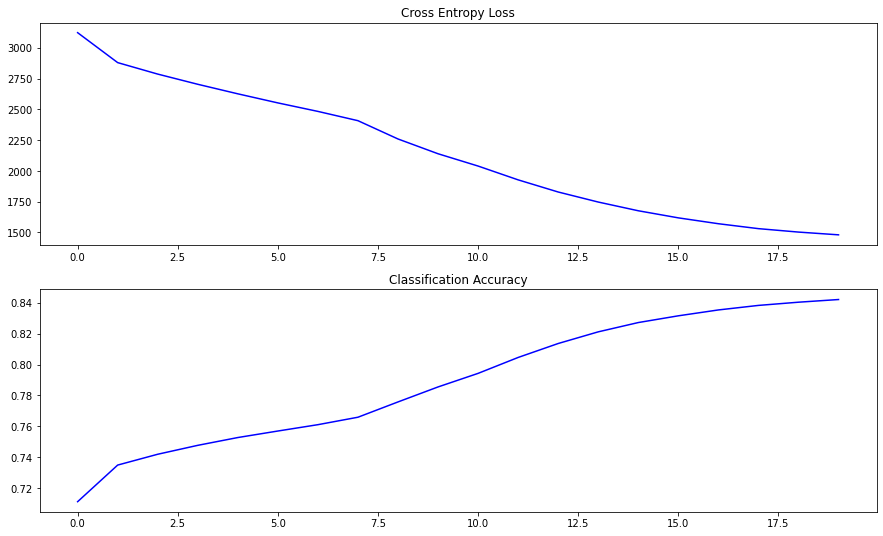

In [ ]:
plt.figure(figsize=(15,9))
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history['loss'], color='blue', label='train')
# plt.plot(his.history['val_loss'], color='orange', label='test')
# plot accuracy
plt.subplot(212)

plt.title('Classification Accuracy')
plt.plot(history['accuracy'], color='blue', label='train')
# plt.plot(his.history['val_accuracy'], color='orange', label='test')
plt.show()

# So sánh 2 mô hình


 - Lấy 3 tấm ảnh không phải từ tập dataset gồm: <br/>
+ ảnh trẻ em
+ ảnh người trưởng thành 
+ ảnh người già
 -  Sau đó dự doán bằng 2 mô hình và so sánh về tốc độ lẫn khả năng tô màu 

## load weight cho cả 2 mô hình

In [ ]:
# generator.load_weights('/content/drive/MyDrive/TOMAUANH/model/modeGEN256.h5')
model.load_weights('/content/drive/MyDrive/TOMAUANH/model/modelResnets.h5')

NameError: ignored

## Định nghĩa hàm predict

In [ ]:
import cv2
img_size = 256

def predict_gen(link):
    im = cv2.imread(str(link))                  
    im = cv2.resize(im, (img_size, img_size))  
    im = np.array(im)
    img_lab = rgb2lab(im).astype("float32")
    L = img_lab[...,[0] ]/ 50. - 1.
    ab = img_lab[...,[1, 2] ]/ 110. 
    ab_pre = generator.predict(L.reshape((1,img_size,img_size,1)))  
    im_pre = lab_to_rgb(L.reshape((1,img_size,img_size,1)), ab_pre)
    return im_pre[0]

def predict_res(link):
    img = cv2.imread(str(link))
    img = cv2.resize(img, (img_size, img_size))
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    predict_img = model.predict(img_hsv[:, :, 2].reshape((1,img_size,img_size,1)))
    predict_img = hsv_to_rgb(img_hsv[:, :, 2].reshape((1,img_size,img_size)), predict_img)
    return predict_img[0]

In [ ]:
import time
gen_pre_img = []
res_pre_img = []
Grayscaled_Image = []
link1 = '/content/drive/MyDrive/TOMAUANH/Anhpredict/anhtreem.jfif'
link2 = '/content/drive/MyDrive/TOMAUANH/Anhpredict/anhtruongthanh.jfif'
link3 = '/content/drive/MyDrive/TOMAUANH/Anhpredict/anhnguoigia.jfif'

start = time.time()
gen_pre_img.append(predict_gen(link1))
gen_pre_img.append(predict_gen(link2))
gen_pre_img.append(predict_gen(link3))
end= time.time()
print('Thời gian trung bình để dự đoán của mô hình cGAN là: ',(end-start)/3,' seconds')

# start = time.time()
# res_pre_img.append(predict_res(link1))
# res_pre_img.append(predict_res(link2))
# res_pre_img.append(predict_res(link3))
# end= time.time()
print('Thời gian trung bình để dự đoán của mô hình Resnet-fineturning là: ',(end-start)/3,' seconds')

Grayscaled_Image.append(plt.imread(link1))
Grayscaled_Image.append(plt.imread(link2))
Grayscaled_Image.append(plt.imread(link3))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:4212: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


Thời gian trung bình để dự đoán của mô hình cGAN là:  0.10956279436747234  seconds


NameError: ignored

## Show ảnh

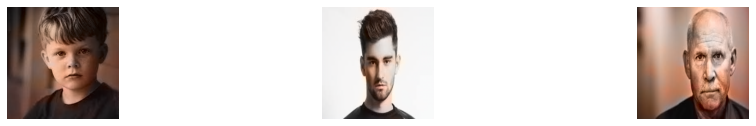

In [ ]:
plt.figure(figsize=(16,7))
for i in range(3):
    # ax = plt.subplot(3, 3, i + 1 )
    # ax.imshow(Grayscaled_Image[i])
    # ax.axis("off")
    ax = plt.subplot(3, 3, i + 1 +3 )
    ax.imshow(gen_pre_img[i])
    # ax.axis("off")
    # ax = plt.subplot(3, 3, i + 1 + 6)
    # ax.imshow(res_pre_img[i])
    ax.axis("off")
plt.show()